In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

1.10.0+cu111 True


In [ ]:
!pip install pyyaml==5.1

In [ ]:
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html


In [ ]:
# !pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Import and Register Custom Detectron2 Data

In [ ]:
!curl -L "https://app.roboflow.com/ds/RjUCFGghlo?key=JfpSRecueQ" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0   1377      0 --:--:-- --:--:-- --:--:--  1375
100  646M  100  646M    0     0  79.0M      0  0:00:08  0:00:08 --:--:-- 97.0M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/A03_00Bb_jpg.rf.44cdabab1ad23b8707c87d67c4c22e09.jpg  
 extracting: test/A03_01Aa_jpg.rf.2ff741e218bee82088c1ff7447286793.jpg  
 extracting: test/A03_01Ab_jpg.rf.b0b10966af17ef238e7a7fd25f9dba4e.jpg  
 extracting: test/A03_01Ac_jpg.rf.fc8d3c31cee0b2ea25090523d176b59e.jpg  
 extracting: test/A03_01Bc_jpg.rf.ebf444ef1b5165932497055ae21d55c8.jpg  
 extracting: test/A03_02Ab_jpg.rf.782a54867e7c857d47f6ea70d0ab31a7.jpg  
 extracting: test/A03_03Bc_jpg.rf.cd6ecd559c1b71a5dd0500fbfd1ff382.jpg  
 extracting: test/A03_04Ad_jpg.rf.dc7de55144255981275ca

In [ ]:
import json

base_path = '/content/'
list_folders = ['train/','valid/','test/']
categories_Map = {1:0, 2:1}

for folder in list_folders:
  path = os.path.join(base_path,folder)
  
  read_file = open(os.path.join(path,"_annotations.coco.json"), "r+")
  data = json.load(read_file)
  del(data['categories']['id' == 0])
  
  for list_dict in data['categories']:
    list_dict['id'] = categories_Map[list_dict['id']]
  
  for list_dict in data['annotations']:
    list_dict['category_id'] = categories_Map[list_dict['category_id']]

  a_file = open(os.path.join(path,"_annotations.coco.json"), "w")
  json.dump(data, a_file,indent=4)
  a_file.close()

In [ ]:
# from google.colab import files
# files.download('./Data/train/_annotations.coco.json')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


In [ ]:
cell_metadata = MetadataCatalog.get("dataset_train")
cell_dicts = DatasetCatalog.get("dataset_train")

WARNING [03/06 13:16:25 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/06 13:16:25 d2.data.datasets.coco]: Loaded 1131 images in COCO format from /content/train/_annotations.coco.json


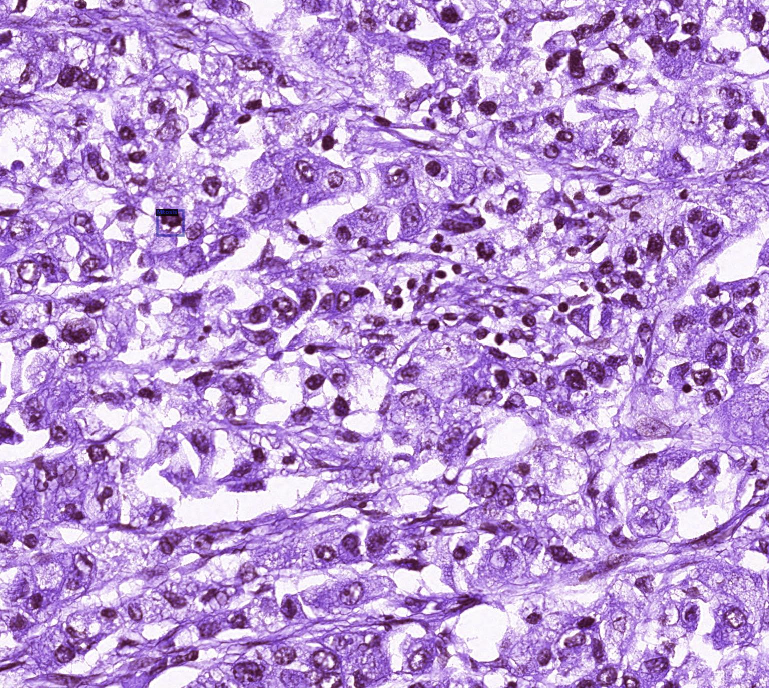

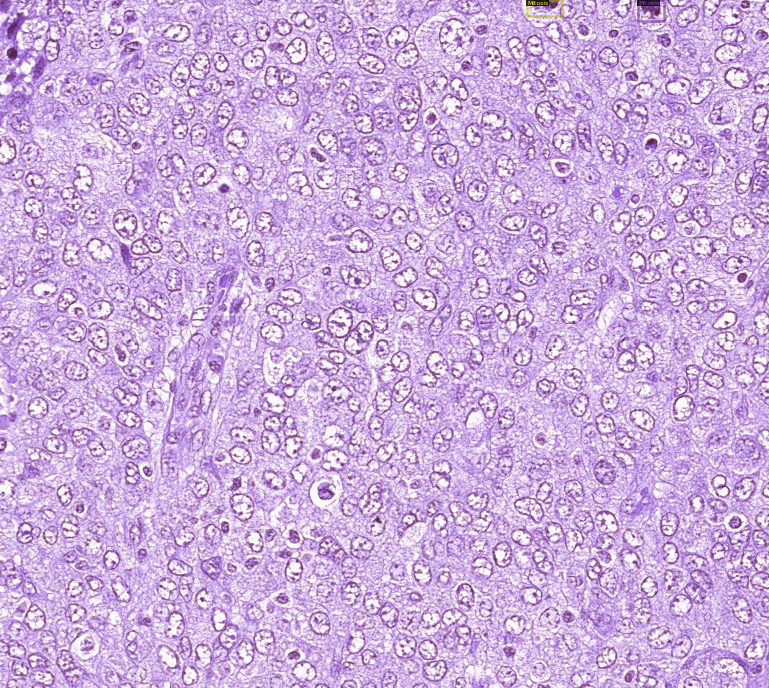

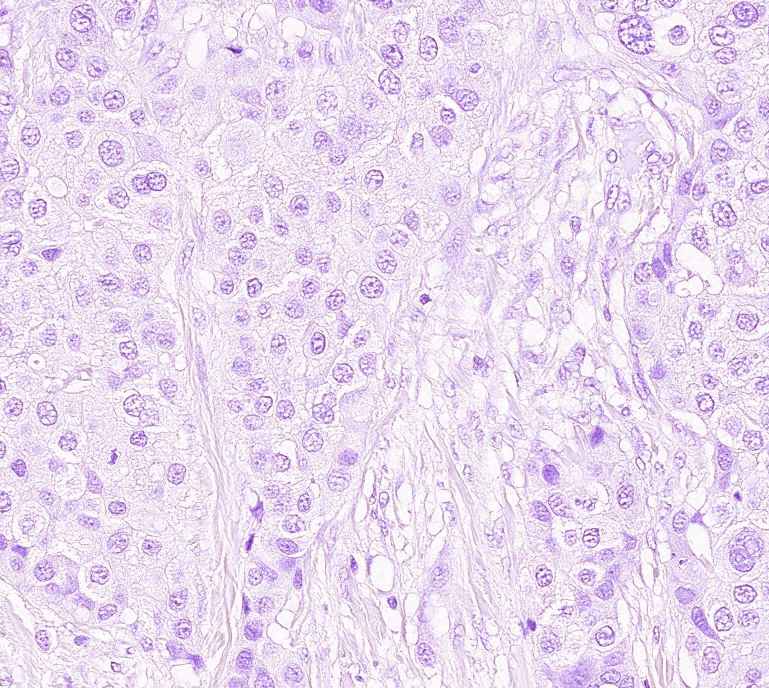

In [ ]:
import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(cell_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cell_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [ ]:
!git clone https://github.com/facebookresearch/detectron2

Cloning into 'detectron2'...
remote: Enumerating objects: 13917, done.
remote: Total 13917 (delta 0), reused 0 (delta 0), pack-reused 13917
Receiving objects: 100% (13917/13917), 5.70 MiB | 13.20 MiB/s, done.
Resolving deltas: 100% (10050/10050), done.


In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST  = ("dataset_train",)
# cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.OUTPUT_DIR = '/content/drive/MyDrive/Model'
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
# cfg.SOLVER.WARMUP_ITERS = 50
cfg.SOLVER.MAX_ITER = 660 #adjust up if val mAP is still rising, adjust down if overfit
# cfg.SOLVER.STEPS = (1000, 1500)
# cfg.SOLVER.GAMMA = 0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 #your number of classes + 1

# cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/06 13:16:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[03/06 13:17:03 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-p

[03/06 13:18:29 d2.utils.events]:  eta: 0:46:49  iter: 19  total_loss: 0.2999  loss_cls: 0.06939  loss_box_reg: 0.2098  loss_rpn_cls: 0.004092  loss_rpn_loc: 0.009122  time: 4.2590  data_time: 0.0536  lr: 2.9759e-05  max_mem: 7923M
[03/06 13:19:55 d2.utils.events]:  eta: 0:45:34  iter: 39  total_loss: 0.2998  loss_cls: 0.06659  loss_box_reg: 0.2303  loss_rpn_cls: 0.002486  loss_rpn_loc: 0.009225  time: 4.2745  data_time: 0.0203  lr: 6.0032e-05  max_mem: 7923M
[03/06 13:21:20 d2.utils.events]:  eta: 0:44:10  iter: 59  total_loss: 0.2879  loss_cls: 0.05715  loss_box_reg: 0.2204  loss_rpn_cls: 0.001825  loss_rpn_loc: 0.008767  time: 4.2614  data_time: 0.0206  lr: 9.0305e-05  max_mem: 7923M
[03/06 13:22:47 d2.utils.events]:  eta: 0:43:02  iter: 79  total_loss: 0.2966  loss_cls: 0.05257  loss_box_reg: 0.2395  loss_rpn_cls: 0.0007343  loss_rpn_loc: 0.008872  time: 4.2855  data_time: 0.0201  lr: 0.00012058  max_mem: 7923M
[03/06 13:24:13 d2.utils.events]:  eta: 0:41:17  iter: 99  total_loss: 

In [ ]:
# Look at training curves in tensorboard:
# %load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Model'  --host localhost

<IPython.core.display.Javascript object>

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [03/06 14:20:26 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [03/06 14:20:26 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/06 14:20:26 d2.data.datasets.coco]: Loaded 87 images in COCO format from /content/test/_annotations.coco.json
[03/06 14:20:26 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  Mitosis   | 85           |
|            |              |
[03/06 14:20:26 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/06 14:20:26 d2.data.common]: Serializing 87 elements to byte tensors and concatenating them all ...
[03/06 14:20:26 d2.data.common]: Serialized dataset takes 0.02 MiB
[03/06 14:20:26 d2.evaluat

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[03/06 14:20:30 d2.evaluation.evaluator]: Inference done 11/87. Dataloading: 0.0010 s/iter. Inference: 0.2131 s/iter. Eval: 0.0002 s/iter. Total: 0.2143 s/iter. ETA=0:00:16
[03/06 14:20:35 d2.evaluation.evaluator]: Inference done 35/87. Dataloading: 0.0015 s/iter. Inference: 0.2138 s/iter. Eval: 0.0002 s/iter. Total: 0.2156 s/iter. ETA=0:00:11
[03/06 14:20:40 d2.evaluation.evaluator]: Inference done 59/87. Dataloading: 0.0016 s/iter. Inference: 0.2143 s/iter. Eval: 0.0002 s/iter. Total: 0.2162 s/iter. ETA=0:00:06
[03/06 14:20:45 d2.evaluation.evaluator]: Inference done 82/87. Dataloading: 0.0016 s/iter. Inference: 0.2151 s/iter. Eval: 0.0002 s/iter. Total: 0.2170 s/iter. ETA=0:00:01
[03/06 14:20:46 d2.evaluation.evaluator]: Total inference time: 0:00:17.953157 (0.218941 s / iter per device, on 1 devices)
[03/06 14:20:46 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:17 (0.215314 s / iter per device, on 1 devices)
[03/06 14:20:46 d2.evaluation.coco_evaluation]: Prepar

OrderedDict([('bbox',
              {'AP': 31.18220329411917,
               'AP50': 52.85951902829458,
               'AP75': 35.515264624154696,
               'APl': nan,
               'APm': 32.897526501189496,
               'APs': 6.512965582272512})])

In [ ]:
cfg.OUTPUT_DIR = '/content/drive/MyDrive/Model'
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")


# Inference with Detectron2 Saved Weights



In [ ]:
%ls ./output/

coco_instances_results.json                       last_checkpoint
events.out.tfevents.1644583406.3b86f8193545.82.0  metrics.json
instances_predictions.pth                         model_final.pth


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
